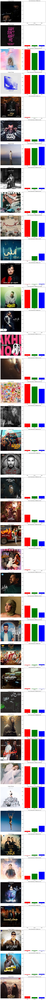

In [23]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Function to analyze image
def analyze_image(image_path):
    # Open image and get dimensions
    image = Image.open(image_path)
    width, height = image.size
    
    # Get color palette
    palette = image.getpalette()
    
    # Count number of colors
    if palette is not None:
        color_count = len(palette) // 3
    else:
        color_count = len(set(image.getdata()))
    
    # Calculate aspect ratio
    aspect_ratio = width / height
    
    # Calculate color dominance
    pixel_count_list = list(image.getdata())
    color_dict = {}
    for pixel_count in pixel_count_list:
        if pixel_count not in color_dict:
            color_dict[pixel_count] = 1
        else:
            color_dict[pixel_count] += 1
    color_dominance = max(color_dict, key=color_dict.get)
    
    # Return analysis results as a dictionary
    analysis_results = {
        'filename': os.path.basename(image_path),
        'width': width,
        'height': height,
        'color_count': color_count,
        'aspect_ratio': aspect_ratio,
        'color_dominance': color_dominance
    }
    return analysis_results

# Set directory containing images
directory = 'output_images'

# Initialize list to store analysis results
analysis_results_list = []

# Loop through images in directory and analyze each one
for filename in os.listdir(directory):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        image_path = os.path.join(directory, filename)
        analysis_results = analyze_image(image_path)
        analysis_results_list.append(analysis_results)

# Create subplots to show analysis results visually
fig, axs = plt.subplots(nrows=len(analysis_results_list), ncols=2, figsize=(10, 5 * len(analysis_results_list)))

# Loop through analysis results and plot each one
for i, analysis_results in enumerate(analysis_results_list):
    # Open image and show it
    image = Image.open(os.path.join(directory, analysis_results['filename']))
    axs[i, 0].imshow(image)
    axs[i, 0].axis('off')
    axs[i, 0].set_title(analysis_results['filename'])
    
    # Create a bar chart to show color dominance
    color_dominance = analysis_results['color_dominance']
    axs[i, 1].bar(range(3), color_dominance, color=['red', 'green', 'blue'])
    axs[i, 1].set_xticks(range(3))
    axs[i, 1].set_xticklabels(['Red', 'Green', 'Blue'])
    axs[i, 1].set_ylim(0, 255)
    axs[i, 1].set_title('Color Dominance: RGB({},{},{})'.format(color_dominance[0], color_dominance[1], color_dominance[2]))

plt.tight_layout()
plt.show()
